# HAPPY WHALES AND DOLPHINS INDENTIFICATION - CNN Model

A CNN Model

Competition Link: https://www.kaggle.com/competitions/happy-whale-and-dolphin

Data Source: https://www.kaggle.com/competitions/happy-whale-and-dolphin/data


#### Files:

* train_images/ - a folder containing the training images
* train.csv - provides the species and the individual_id for each of the training images
* test_images/ - a folder containing the test images; for each image, your task is to predict the individual_id; no species information is given for the test data; there are individuals in the test data that are not observed in the training data, which should be predicted as new_individual.
* sample_submission.csv - a sample submission file in the correct format

#### This notebook has the follow steps:

* Brief Description of the Problem and Data
* Exploratory Data Analysis (EDA) and Preprocessing
* Model Construction and Architecture
* Results and Analysis
* Conclusion

In [1]:
 # Import libraries:

import numpy as np
import pandas as pd
import os
import random
import shutil
import glob
from sklearn.utils import shuffle

# for image:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

# for model:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Activation, Dropout, BatchNormalization, LeakyReLU
from tensorflow.keras.layers import Conv2D, AveragePooling2D, MaxPooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [2]:
# Check tensorflow verison:

tf.__version__

'2.11.0'

## Brief Description of the Problem and Data:

Whales and dolphins are a key component for the marine ecosystem so being able to identify species could be helpful for other research projects. 

In this project, we are given 51033 images which are connected to the training dataframe, in which we are given the columns 'image id' as jpg, 'species', and 'individual_id'. We also are given testing images.

We also note that we do not have bounding boxes on the images and all the images are different shapes and resolutions.

The main task was to predict individual whales and dolphins from images of their fins. Whales and dolphins in this dataset can be identified by shapes, features and markings of dorsal fins, backs, heads and flanks.


In [ ]:
# Get global path:

print(os.listdir('../input'))

In [4]:
# Get global path:

print(os.listdir('../input/happy-whale-and-dolphin'))

['sample_submission.csv', 'train_images', 'train.csv', 'test_images']


In [5]:
# Set paths:

train = '../input/happy-whale-and-dolphin/train_images'
test = '../input/happy-whale-and-dolphin/test_images'

In [6]:
# Dimensions:

print(len(os.listdir(train)))
print(len(os.listdir(test)))

51033
27956


In [7]:
# Get image paths:

print(os.listdir(train)[:5])
print(os.listdir(test)[:5])

['80b5373b87942b.jpg', 'e113b51585c677.jpg', '94eb976e25416c.jpg', '19a45862ab99cd.jpg', 'be9645065510e9.jpg']
['cd50701ae53ed8.jpg', '177269f927ed34.jpg', '9137934396d804.jpg', 'c28365a55a0dfe.jpg', '1a40b7b382923a.jpg']


In [8]:
# Set image paths:

train_jpg = tf.io.gfile.glob(train+'/*.jpg')
test_jpg = tf.io.gfile.glob(test+'/*.jpg')

In [9]:
# View train dataset:

train_data = pd.read_csv('../input/happy-whale-and-dolphin/train.csv', sep = ',')
train_data.head()

,image,species,individual_id
0,00021adfb725ed.jpg,melon_headed_whale,cadddb1636b9
1,000562241d384d.jpg,humpback_whale,1a71fbb72250
2,0007c33415ce37.jpg,false_killer_whale,60008f293a2b
3,0007d9bca26a99.jpg,bottlenose_dolphin,4b00fe572063
4,00087baf5cef7a.jpg,humpback_whale,8e5253662392


In [10]:
# View train dataset:

train_data.sample(5)

,image,species,individual_id
29964,96b2ef32b3f7f2.jpg,blue_whale,032db6d0595d
16847,550457c2fd961f.jpg,false_killer_whale,62ec6fea7ad5
48259,f2454d51afe667.jpg,bottlenose_dolphin,2aa3e856e46e
6289,1f55257dd0382f.jpg,fin_whale,56242d3430ae
47013,ec46e4384894eb.jpg,bottlenose_dolphin,c995c043c353


In [11]:
# Size:

train_data.shape

(51033, 3)

In [12]:
# Training data information and data types:

train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51033 entries, 0 to 51032
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   image          51033 non-null  object
 1   species        51033 non-null  object
 2   individual_id  51033 non-null  object
dtypes: object(3)
memory usage: 1.2+ MB


In [13]:
# Data Description:

train_data.describe(include = 'all')

,image,species,individual_id
count,51033,51033,51033
unique,51033,30,15587
top,00021adfb725ed.jpg,bottlenose_dolphin,37c7aba965a5
freq,1,9664,400


In [14]:
# Number of missing data:

train_data.isnull().sum()

image            0
species          0
individual_id    0
dtype: int64

In [15]:
# Value counts of species variable:

train_data.species.value_counts()

bottlenose_dolphin           9664
beluga                       7443
humpback_whale               7392
blue_whale                   4830
false_killer_whale           3326
dusky_dolphin                3139
spinner_dolphin              1700
melon_headed_whale           1689
minke_whale                  1608
killer_whale                 1493
fin_whale                    1324
gray_whale                   1123
bottlenose_dolpin            1117
kiler_whale                   962
southern_right_whale          866
spotted_dolphin               490
sei_whale                     428
short_finned_pilot_whale      367
common_dolphin                347
cuviers_beaked_whale          341
pilot_whale                   262
long_finned_pilot_whale       238
white_sided_dolphin           229
brydes_whale                  154
pantropic_spotted_dolphin     145
globis                        116
commersons_dolphin             90
pygmy_killer_whale             76
rough_toothed_dolphin          60
frasiers_dolph

In [16]:
# Check duplication:

sum(train_data.individual_id.duplicated())

35446

## Exploratory Data Analysis (EDA) and Preprocessing:

Summary of preprocessing steps we will perform:

* Loading the image
* Fix misspellings
* Properly group whales and dolphins
* Normalize images (multiply by 1/255)
* Crop images to 64x64 pixel and 3 channels (64, 64, 3)
* Split into training-validation sets (80-20 split)

In [17]:
# Loading an image files by its path:

def Load_Image(path):
    image_path = tf.io.read_file(path)
    image_path = tf.image.decode_image(image_path, channels = 3)
    image_path = tf.image.convert_image_dtype(image_path, tf.float32)
    return image_path

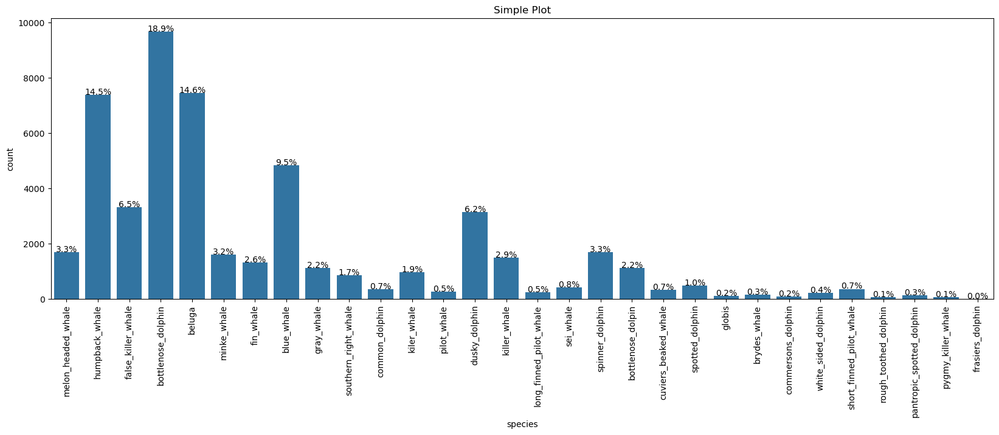

In [18]:
# Visualization:
# Plot of unique species and their percentage:


plt.figure(figsize = [20,6])

color = sns.color_palette()[0]

sns.countplot(data = train_data, x = 'species', color = color);
plt.title('Simple Plot');
plt.ylabel('count');
plt.xlabel('species');

value_sum = train_data['species'].value_counts().sum()
value = train_data['species'].value_counts()

locs, labels = plt.xticks(rotation = 90) 

for loc, label in zip(locs, labels):

    count = value[label.get_text()]
    text = '{:0.1f}%'.format(100 * count/value_sum)

    plt.text(loc, count+3, text, ha = 'center', color = 'black');

In [19]:
# Fix mis-spellings from species variable:

train_data['species'] = train_data['species'].replace({'kiler_whale': 'killer_whale', 
                               'globis': 'pilot_whale', 
                               'beluga': 'beluga_whale',
                               'bottlenose_dolpin': 'bottlenose_dolphin',
                               'short_finned_pilot_whale': 'pilot_whale',
                               'long_finned_pilot_whale': 'pilot_whale'})

In [20]:
# Declare dolphin and whale variables for further analysis:

dolphin = ['bottlenose_dolphin','common_dolphin','dusky_dolphin', 'spinner_dolphin', 'spotted_dolphin', 'commersons_dolphin', 
           'white_sided_dolphin', 'rough_toothed_dolphin', 'pantropic_spotted_dolphin', 'frasiers_dolphin']


whale = ['melon_headed_whale', 'humpback_whale', 'false_killer_whale', 'belug_whale', 'minke_whale', 'fin_whale', 'blue_whale', 'gray_whale',
         'southern_right_whale', 'killer_whale', 'pilot_whale', 'sei_whale', 'cuviers_beaked_whale', 'brydes_whale', 'pygmy_killer_whale']


# Add to train dataset:
train_data['family'] = 'dolphin'

for ele in range(len(train_data)):
    if train_data.species[ele] in whale:
        train_data.family[ele] = 'whale'
        
        
train_data.sample(5)

,image,species,individual_id,family
37227,bb1c19a56b4587.jpg,beluga_whale,7dc63cb16112,dolphin
27278,8997af8283fcc4.jpg,pilot_whale,bcd01b3b0aad,whale
38673,c2531964e31f2a.jpg,bottlenose_dolphin,5bf17305f073,dolphin
7240,24314745a5136a.jpg,bottlenose_dolphin,d2eff394100e,dolphin
13430,43b358916e8908.jpg,spinner_dolphin,d11cea004dd1,dolphin


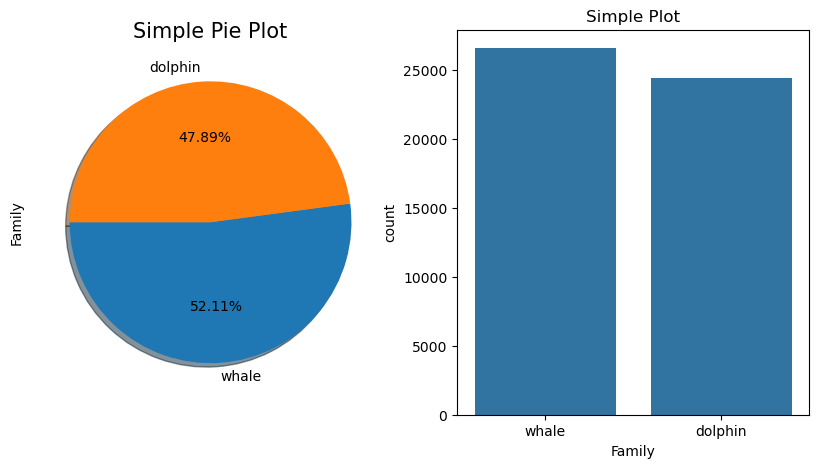

In [21]:
# Visualization:
# Plot of family of species and their percentage:

plt.figure(figsize = [10, 5])
labels = train_data.family.value_counts()

plt.subplot(1,2,1)
labels.plot(kind = 'pie', autopct = '%1.2f%%', shadow = True, startangle = 180)
plt.title('Simple Pie Plot',fontsize = 15)
plt.ylabel('Family',fontsize = 10);

plt.subplot(1,2,2)
sns.countplot(data = train_data, x = 'family', color = color);
plt.title('Simple Plot');
plt.ylabel('count');
plt.xlabel('Family');

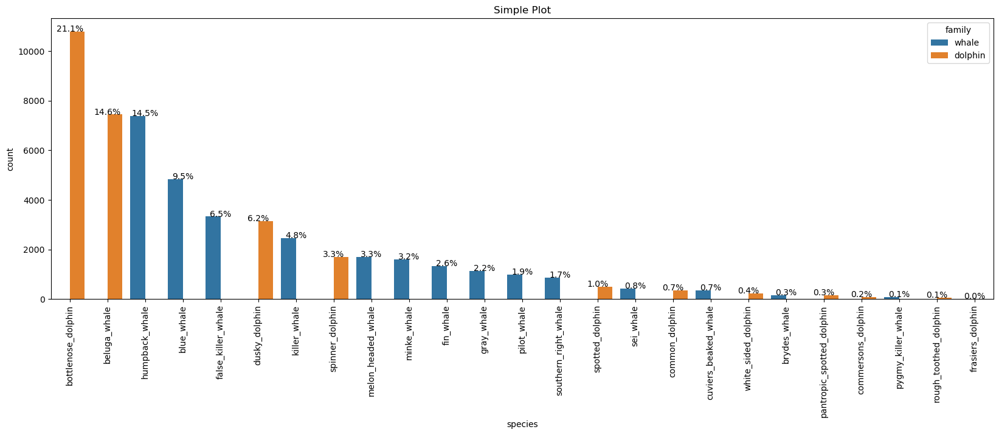

In [22]:
# Visualization:
# Plot of unique species and their percentage with hue = family:

plt.figure(figsize = [20,6])

sns.countplot(data = train_data, x = 'species', hue = 'family', order = train_data['species'].value_counts().index);
plt.title('Simple Plot');
plt.ylabel('count');
plt.xlabel('species');

value_sum = train_data['species'].value_counts().sum()
value = train_data['species'].value_counts()

locs, labels = plt.xticks(rotation = 90) 

for loc, label in zip(locs, labels):

    count = value[label.get_text()]
    text = '{:0.1f}%'.format(100 * count/value_sum)

    plt.text(loc, count+1, text, ha = 'center', color = 'black');

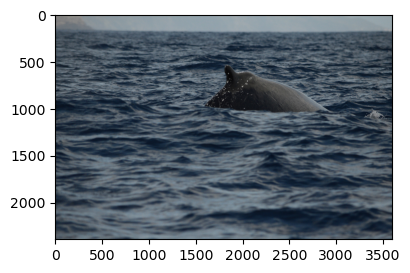

In [23]:
# Visualization:
# Plotting an example from train image:

from keras.preprocessing import image
from keras.utils import load_img, img_to_array


plt.figure(figsize = (20, 20))

plt.subplot(1, 4, 1)
image = load_img('../input/happy-whale-and-dolphin/train_images/80b5373b87942b.jpg')
plt.imshow(image);

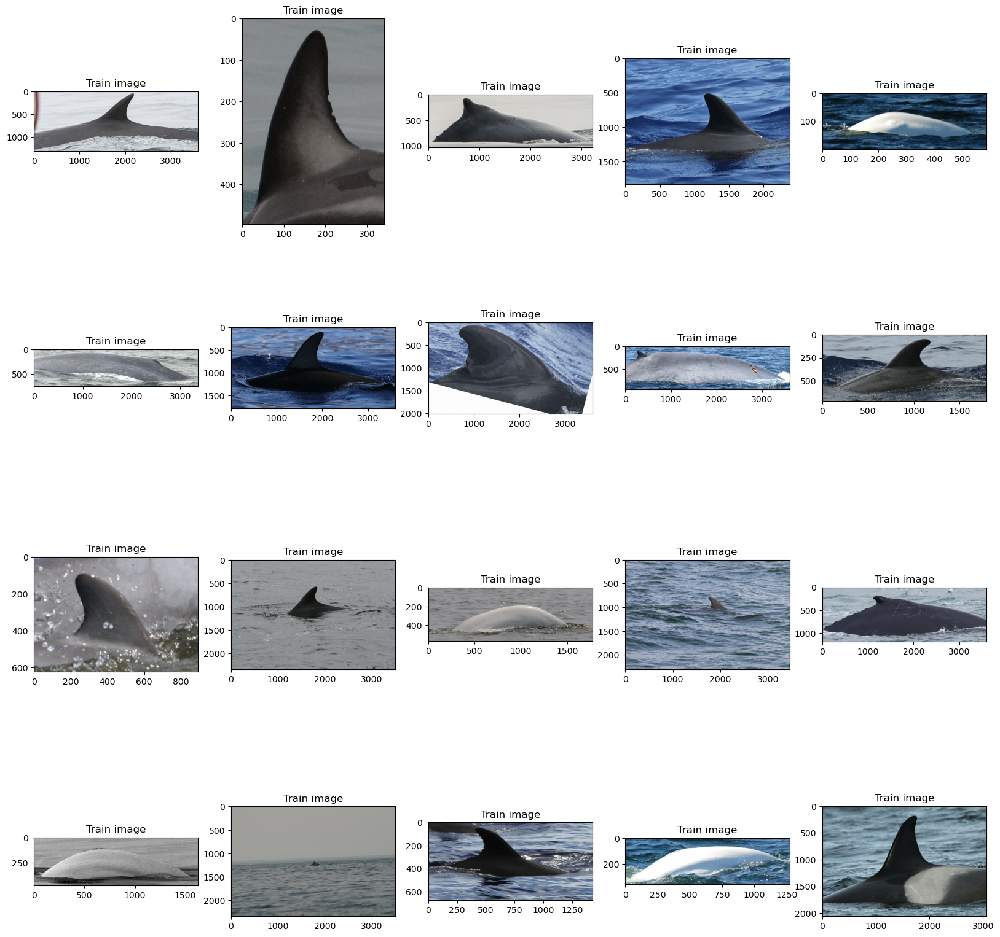

In [24]:
# Visualization:
# Plotting some examples from Train image path:

fig, ax = plt.subplots(4, 5, figsize = (20, 20))

jpg = random.sample(train_jpg, 20)

for idx, name in enumerate(jpg):
    img = Load_Image(name)
    ax[idx//5, idx%5].imshow(img)
    ax[idx//5, idx%5].set_title('Train image')

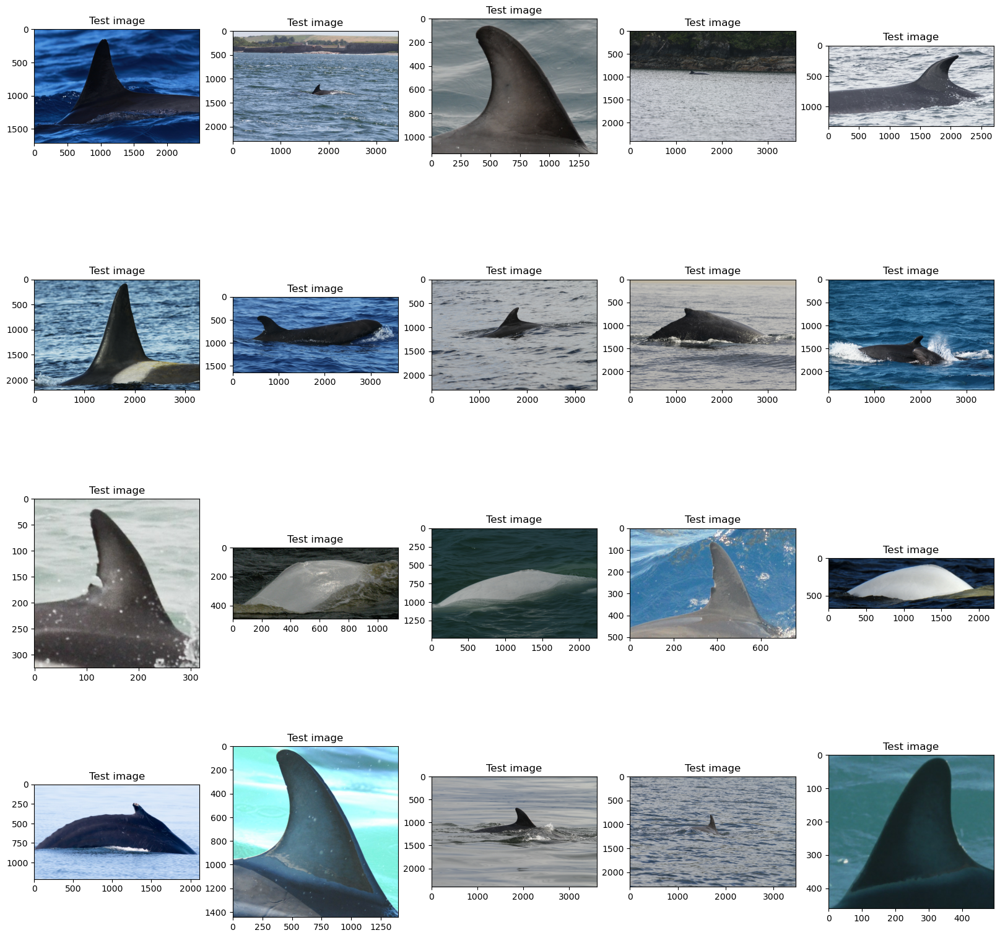

In [25]:
# Visualization:
# Plotting some examples from Test image path:

fig, ax = plt.subplots(4, 5, figsize = (20, 20))

jpg = random.sample(test_jpg, 20)

for idx, name in enumerate(jpg):
    img = Load_Image(name)
    ax[idx//5, idx%5].imshow(img)
    ax[idx//5, idx%5].set_title('Test image')

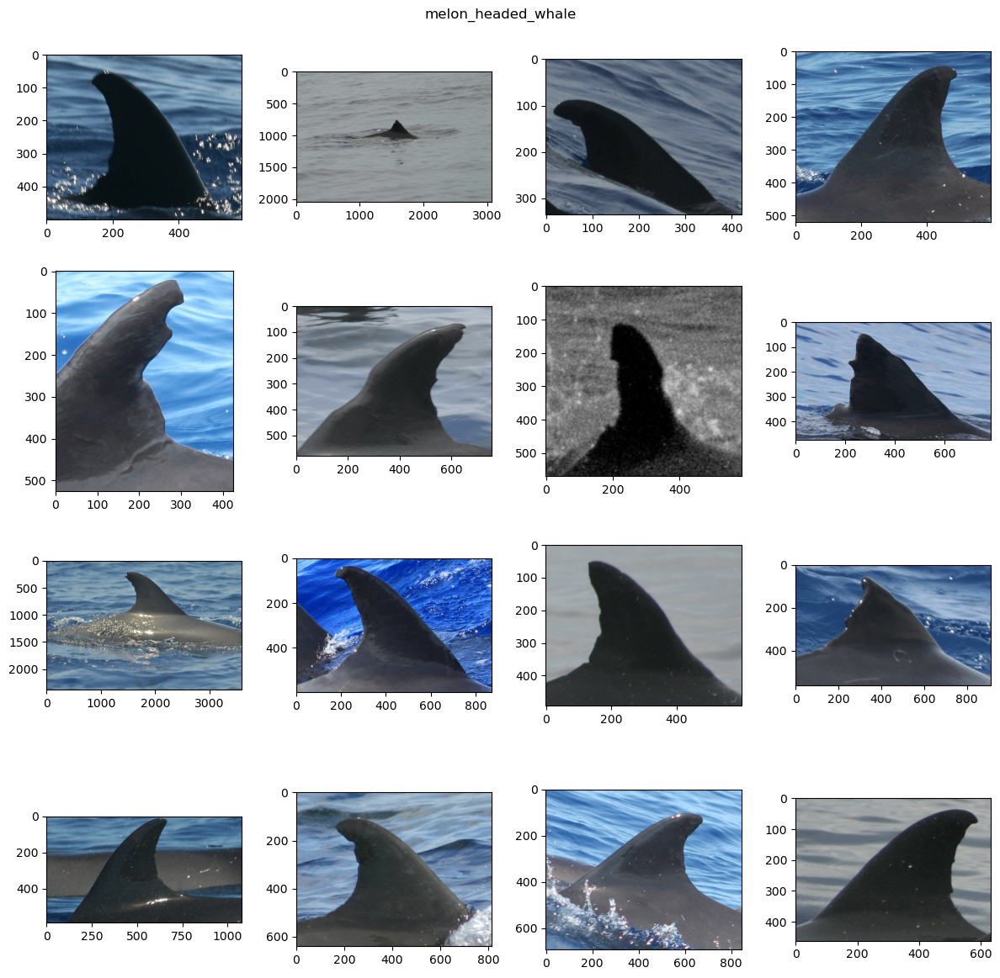

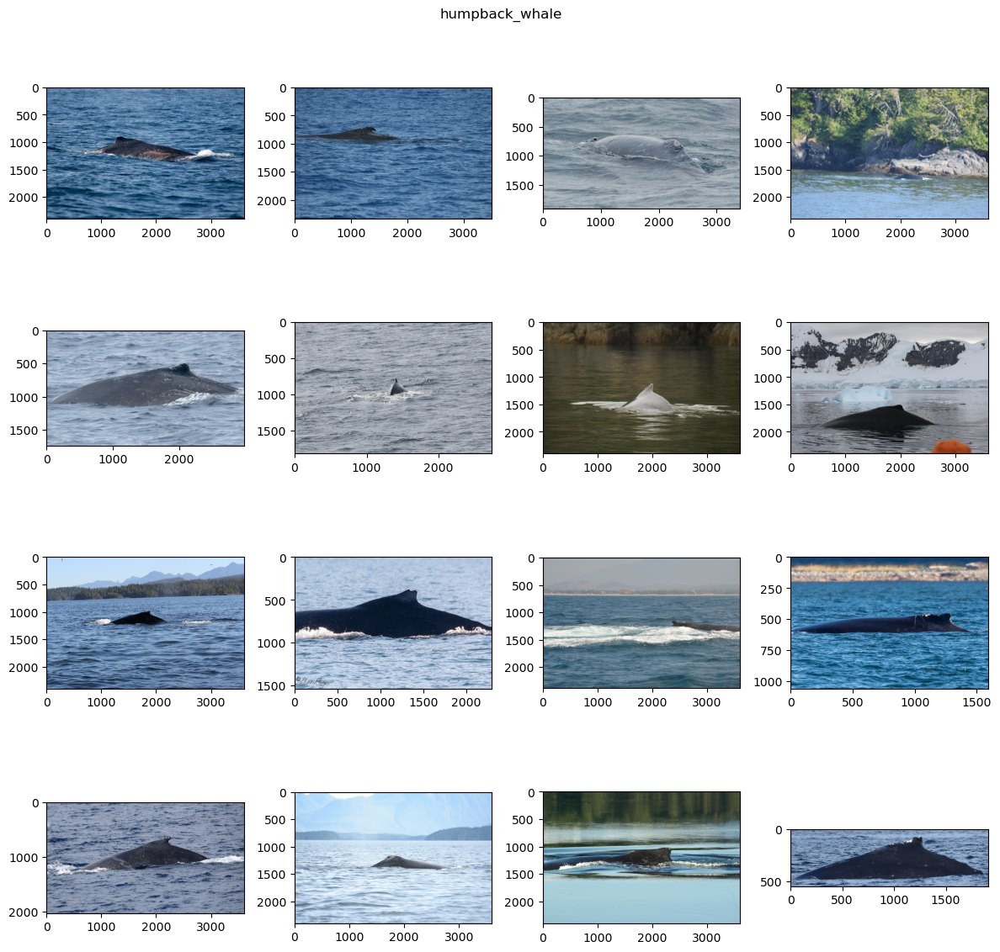

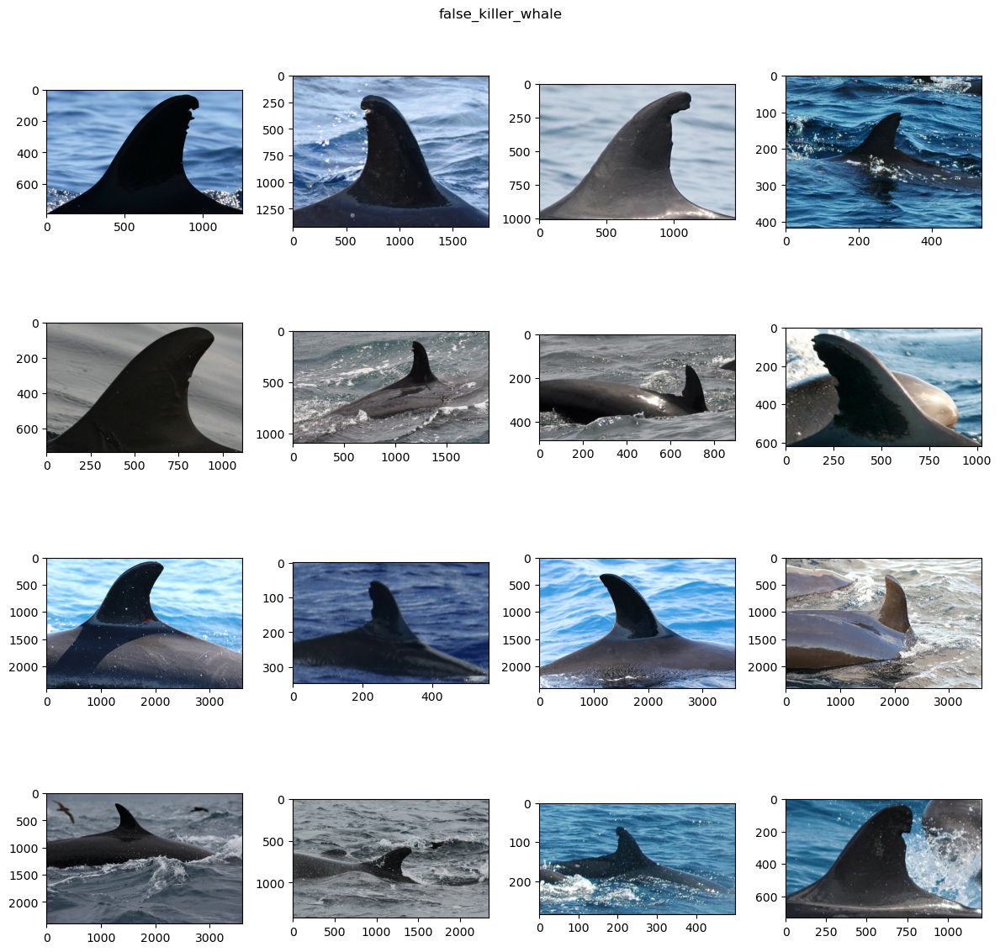

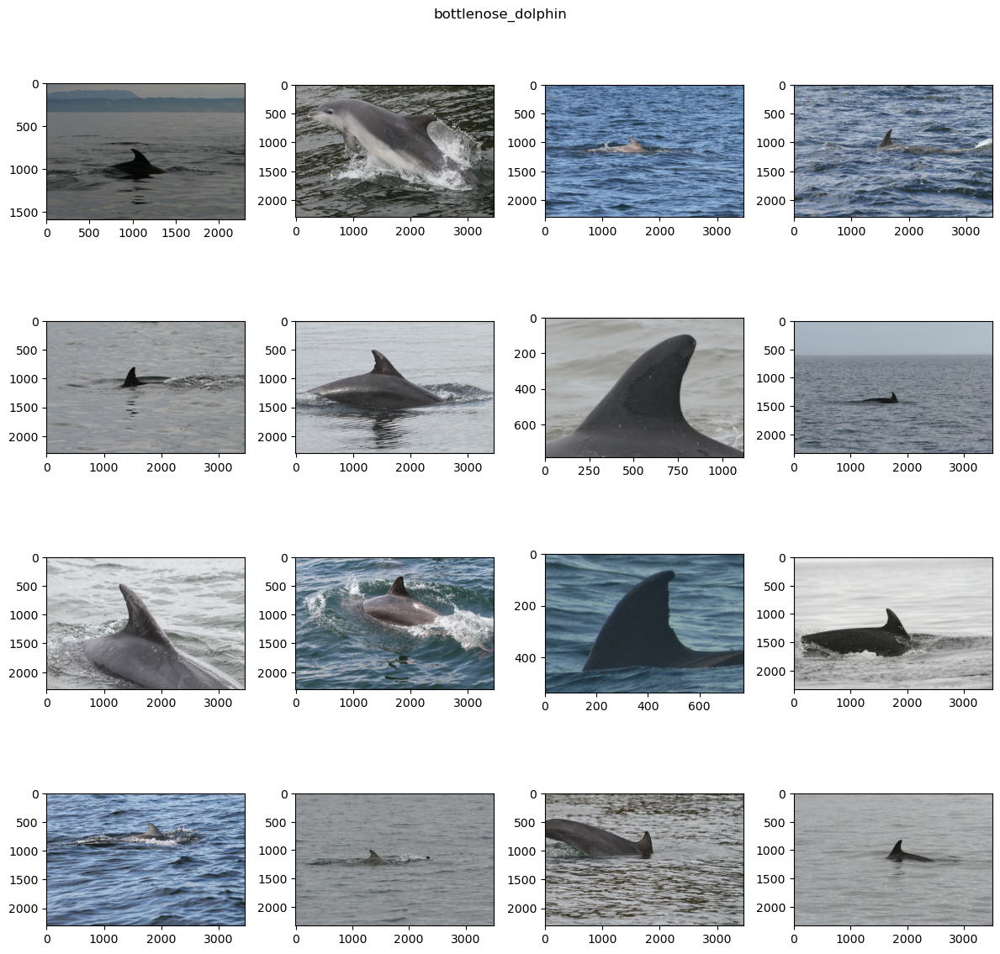

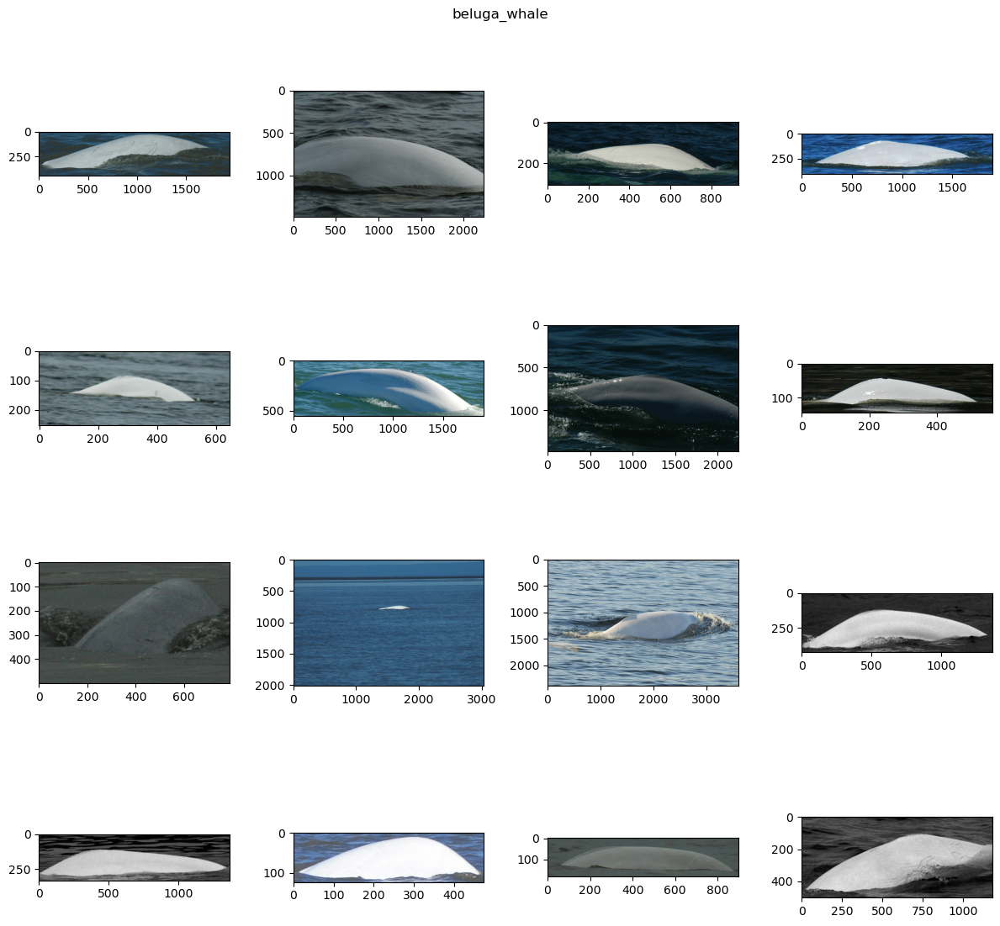

In [28]:
# Visualization:
# Visualization of Unique Specie:

train_data['path'] = '../input/happy-whale-and-dolphin/train_images/' + train_data['image']

def species_plot(data, variable):
    plt.figure(figsize = (12, 12))
    df = data[data['species'] == variable].reset_index(drop = True)
    plt.suptitle(variable)
    
    for idx, ele in enumerate(np.random.choice(df['path'], 16)):
        plt.subplot(4, 4, idx+1)
        image_path = ele
        img = Load_Image(image_path)

        plt.imshow(img)
        
    plt.tight_layout()
    plt.show()
    

for var in train_data['species'].unique()[:5]:
    species_plot(train_data, var)
    

## Model Construction and Architecture:

During model training, we shuffle the data, normalize the images, and crop them to 64x64 pixels. These steps can help make the model more robust and learn better because the images are all standardized and shown in more positions. We will be using Tensorflow layers to construct our models.

For this project we will use one very simple model. The model will have five layers after its "base" layer. We call it a "base" layer so that we may more easily compare the model later on. In addition, model's input will be with a shape of (64, 64, 3). And it has following layers:

* Average Pooling
* Dropout layer with 0.1 dropout
* BatchNormalization
* Output layer using Dense with unique categories and activation function as 'softmax'
* Optimizer Adam

In [31]:
# Set globals:

random_state = 42
batch_size = 256
epochs = 3
seed = 42
target_size = (64, 64)
input_shape = (64, 64, 3)

In [32]:
# Shuffle the dataset:

train_data = shuffle(train_data, random_state = random_state)

In [33]:
# Set up image generator to split into 80/20 train-validation groups:

data_norm = ImageDataGenerator(rescale = 1.0/255, validation_split = 0.20)

In [34]:
# Eet up training batching:

gen_train = data_norm.flow_from_dataframe(train_data,
                                          directory = train,
                                          x_col = 'image',
                                          y_col = 'species',
                                          subset = 'training',
                                          batch_size = batch_size,
                                          class_mode = 'categorical',
                                          seed = seed,
                                          target_size = target_size)

Found 40827 validated image filenames belonging to 25 classes.


In [35]:
# Set up testing/validation batching:

gen_valid = data_norm.flow_from_dataframe(train_data,
                                          directory = train,
                                          x_col = 'image',
                                          y_col = 'species',
                                          subset = 'validation',
                                          batch_size = batch_size,
                                          class_mode = 'categorical',
                                          seed = seed,
                                          target_size = target_size)

Found 10206 validated image filenames belonging to 25 classes.


In [36]:
# Build and Train Simple Model:

mod = Sequential()

# set up base model (simple base):
mod.add(Conv2D(filters = 32, kernel_size = (5, 5), strides = (1, 1), input_shape = input_shape, padding ='valid'))
mod.add(BatchNormalization())
mod.add(Activation(LeakyReLU()))

mod.add(Conv2D(filters = 32, kernel_size = (5, 5), strides = (1, 1), input_shape = input_shape, padding ='valid'))
mod.add(BatchNormalization())
mod.add(Activation(LeakyReLU()))
mod.add(MaxPooling2D(pool_size = (2, 2)))
mod.add(Dropout(0.1))

mod.add(Conv2D(filters = 64, kernel_size = (5, 5), strides = (1, 1), input_shape = input_shape, padding ='valid'))
mod.add(Activation(LeakyReLU()))
mod.add(BatchNormalization())

mod.add(Conv2D(filters = 128, kernel_size = (5, 5), strides = (1, 1), input_shape = input_shape, padding ='valid'))
mod.add(BatchNormalization())
mod.add(Activation(LeakyReLU()))
mod.add(AveragePooling2D(pool_size = (2, 2)))

mod.add(Conv2D(filters = 128, kernel_size = (5, 5), strides = (1, 1), input_shape = input_shape, padding ='valid'))
mod.add(BatchNormalization())
mod.add(Activation(LeakyReLU()))
mod.add(AveragePooling2D(pool_size = (2, 2)))
mod.add(Dropout(0.1))

mod.add(Flatten())

# set dense with activation as softmax:
mod.add(Dense(train_data.species.nunique(), activation = 'softmax'))

# set optimizer with small rate:
opt = Adam(learning_rate = 0.0001)

#set up loss function:
losses = tf.keras.losses.CategoricalCrossentropy() 

# compile model:
mod.compile(loss = 'categorical_crossentropy', metrics = ['accuracy'], optimizer = opt)

# view model summary:
mod.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 60, 60, 32)        2432      
                                                                 
 batch_normalization (BatchN  (None, 60, 60, 32)       128       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 60, 60, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 56, 56, 32)        25632     
                                                                 
 batch_normalization_1 (Batc  (None, 56, 56, 32)       128       
 hNormalization)                                                 
                                                                 
 activation_1 (Activation)   (None, 56, 56, 32)        0

In [37]:
# Train model:

fit = mod.fit(gen_train, epochs = epochs, validation_data = gen_valid)
fit

Epoch 1/3
160/160 [==============================] - 6073s 38s/step - loss: 1.5473 - accuracy: 0.5599 - val_loss: 3.2451 - val_accuracy: 0.1544
Epoch 2/3
160/160 [==============================] - 5878s 37s/step - loss: 1.1226 - accuracy: 0.6607 - val_loss: 2.7737 - val_accuracy: 0.2969
Epoch 3/3
160/160 [==============================] - 5849s 37s/step - loss: 0.9844 - accuracy: 0.6984 - val_loss: 1.6218 - val_accuracy: 0.5084


In [38]:
# Check keys before plotting:

fit.history

{'loss': [1.5473291873931885, 1.1225823163986206, 0.9843943119049072],
 'accuracy': [0.5598745942115784, 0.6607147455215454, 0.6983613967895508],
 'val_loss': [3.245084047317505, 2.773663282394409, 1.6218310594558716],
 'val_accuracy': [0.1544189751148224, 0.2968841791152954, 0.5084264278411865]}

In [39]:
# Convert to DataFrame:

df = pd.DataFrame(fit.history)
df

,loss,accuracy,val_loss,val_accuracy
0,1.547329,0.559875,3.245084,0.154419
1,1.122582,0.660715,2.773663,0.296884
2,0.984394,0.698361,1.621831,0.508426


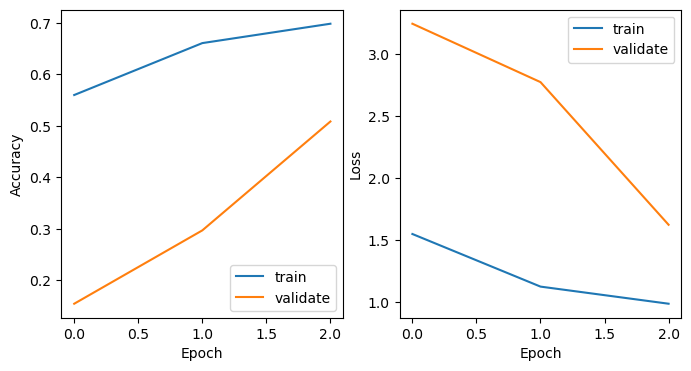

In [40]:
# Visualization:

plt.figure(figsize = (8, 4))


# Graph accuracy:
plt.subplot(1, 2, 1)
plt.plot(df['accuracy'])
plt.plot(df['val_accuracy'])
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['train', 'validate'], loc = 'lower right');

# Graph loss:
plt.subplot(1, 2, 2)
plt.plot(df['loss'])
plt.plot(df['val_loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['train', 'validate'], loc = 'upper right');

In [41]:
# Set test dataset path:

test_data = os.listdir("../input/happy-whale-and-dolphin/test_images")
test_data = pd.DataFrame(data = test_data, columns = ['image'])

test_data['predictions'] = ''

test_data.head()

,image,predictions
0,cd50701ae53ed8.jpg,
1,177269f927ed34.jpg,
2,9137934396d804.jpg,
3,c28365a55a0dfe.jpg,
4,1a40b7b382923a.jpg,


In [42]:
# Loading an image files by its path to predict:

def Loading_Images(data, length, dataset):
    X_train = np.zeros((length, 64, 64, 3))
    count = 0
    for fig in tqdm(data['image']):
        img = load_img("../input/happy-whale-and-dolphin/" + dataset + "/" + fig, target_size = (64,64, 3))
        x = img_to_array(img)
        X_train[count] = x
        count += 1
    return X_train


# Converting to integers and reshaping:

def prepare_labels(arr):  
    values = np.array(arr)
    label_encoder = LabelEncoder() 
    integer_encoded = label_encoder.fit_transform(values)  # standardization 
    onehot_encoder = OneHotEncoder(sparse = False)         
    integer_encoded = integer_encoded.reshape(len(integer_encoded), 1) # reshaping
    onehot_encoded = onehot_encoder.fit_transform(integer_encoded)     # set onehot encoding
    arr = onehot_encoded
    return arr, label_encoder

In [44]:
# Predictions for test dataset:

from tqdm.autonotebook import tqdm
import gc

#set values:
ele, labels = prepare_labels(train_data['individual_id'])
length = len(test_data)
batch_size = 1000
batch_start = 0
batch_end = batch_size


while batch_start < length:
    lim = min(batch_end, length)
    test_batch = test_data.iloc[batch_start:lim]
    
    x = Loading_Images(test_batch, test_batch.shape[0], "test_images")    # loading images
    x = x/225
    
    pred = mod.predict(np.array(x), verbose = 1)                          # prediction
    
    for ele, predict in enumerate(pred):
        predictions = predict.argsort()[:-5][::-1]
        idx = -1
        s = ''; s1 = ''; s2 = ''
        
        for i in predictions:
            idx = idx + 1
            if predict[i] > 0.5:
                s1 = s1 + ' ' + labels.inverse_transform(predictions)[idx] 
            else:
                s2 = s2 + ' ' + labels.inverse_transform(predictions)[idx]
                
        s = s1 + 'new_individual' + s2                                    # adding prediction values to test dataset:
        s = s.strip(' ')
        
        test_data.loc[batch_start + ele, 'predictions'] = s
        
    batch_start += batch_size   
    batch_end += batch_size
    
    del x
    del test_batch
    del pred
    gc.collect()

  0%|          | 0/1000 [00:00<?, ?it/s]

32/32 [==============================] - 5s 161ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

32/32 [==============================] - 5s 164ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

32/32 [==============================] - 5s 162ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

32/32 [==============================] - 6s 190ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

32/32 [==============================] - 6s 173ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

32/32 [==============================] - 6s 178ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

32/32 [==============================] - 6s 174ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

32/32 [==============================] - 5s 161ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

32/32 [==============================] - 5s 159ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

32/32 [==============================] - 5s 160ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

32/32 [==============================] - 5s 162ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

32/32 [==============================] - 5s 166ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

32/32 [==============================] - 5s 164ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

32/32 [==============================] - 5s 166ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

32/32 [==============================] - 5s 165ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

32/32 [==============================] - 6s 172ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

32/32 [==============================] - 5s 164ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

32/32 [==============================] - 5s 162ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

32/32 [==============================] - 5s 164ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

32/32 [==============================] - 5s 160ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

32/32 [==============================] - 6s 175ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

32/32 [==============================] - 5s 169ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

32/32 [==============================] - 6s 180ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

32/32 [==============================] - 5s 164ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

32/32 [==============================] - 6s 178ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

32/32 [==============================] - 5s 161ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

32/32 [==============================] - 5s 160ms/step


  0%|          | 0/956 [00:00<?, ?it/s]

30/30 [==============================] - 5s 165ms/step


## Results:

In [45]:
# Submit results:

test_data.to_csv('submission.csv', index = False)
test_data

,image,predictions
0,cd50701ae53ed8.jpg,new_individual 0018a0f40586 00617ab684fc 006b2...
1,177269f927ed34.jpg,new_individual 00602383dd7e 0044220fa8b1 00655...
2,9137934396d804.jpg,new_individual 0044220fa8b1 002a24f8887c 004bc...
3,c28365a55a0dfe.jpg,new_individual 006bb1f26f00 0022256f1506 0066d...
4,1a40b7b382923a.jpg,new_individual 004bcace9269 0013f1f5f2f0 00442...
...,...,...
27951,ed5868e5fb3eba.jpg,new_individual 002a24f8887c 002371f1ff68 00406...
27952,986ecc6cb6959c.jpg,new_individual 006b2b64d40e 00406b0343ba 005ca...
27953,fd19816a92886f.jpg,new_individual 00403981ddbc 0022256f1506 004bc...
27954,c58c2f75688a31.jpg,new_individual 002a24f8887c 0044220fa8b1 0013f...


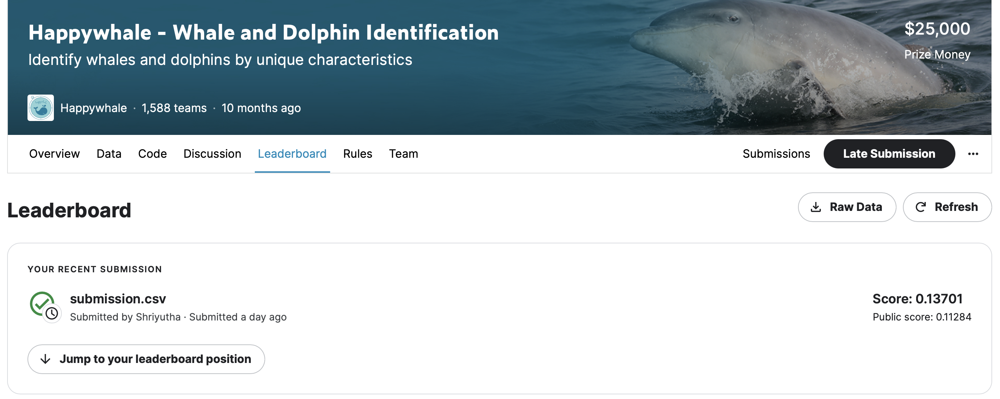

## Conclusion:


The first thing we can see very quickly is the big difference in loss and accuracy in the simple learning model; we see that the model is learning but with only 3 epochs, it gets ~0.25 accuracy and down to ~1.85 loss. 

In our simple model, we used a Conv2D layer as our base layer. We tried different hyperparameters including filters = 64 to 128, strides = (1,1), and kernel_size = (5,5) for better accuracy.

Overall, we are quite happy with our learning model. This study was able to complete its goal by successfully identifying our unique species of dolphins and whales based on images of their fins.



#### Thank You